Pivoting to a hierarchical structure for a scene graph. This is motivated by the complexity of calculating GED for an arbitrary grpah - structuring it as a tree may yield better performance for similarity metric calculation.

# Setup

## Notebook Setup

Google Colab
- Google Colab secrets: add a Gemini API key as `GOOGLE_API_KEY`. May be pre-populated from a previous session.
    - Need to create an account for Gemini and grab a key there.

In [9]:
# assume run from the root of the repository
import os

try:
    if CONFIGURED_DIRS:
        pass
except:
    PLAYGROUND_DIR = os.getcwd()
    os.chdir("../..")

CONFIGURED_DIRS = True

print(f"Notebook directory: {PLAYGROUND_DIR}")
print(f"Working directory: {os.getcwd()}")

Notebook directory: c:\Users\emily\Documents\coursework\vip lab\kalman-filter-scene-graph\graph_distance\hierarchical_sg
Working directory: c:\Users\emily\Documents\coursework\vip lab\kalman-filter-scene-graph


In [10]:
from PIL import Image
import json
from common.draw_class import Drawer
from common.SceneGraphGenerator import SceneGraphGenerator
from common.video import get_zipnerf, extract_frames
from graph_distance.hierarchical_sg.util import simple_print, parse_tree

In [11]:
sgg = SceneGraphGenerator()

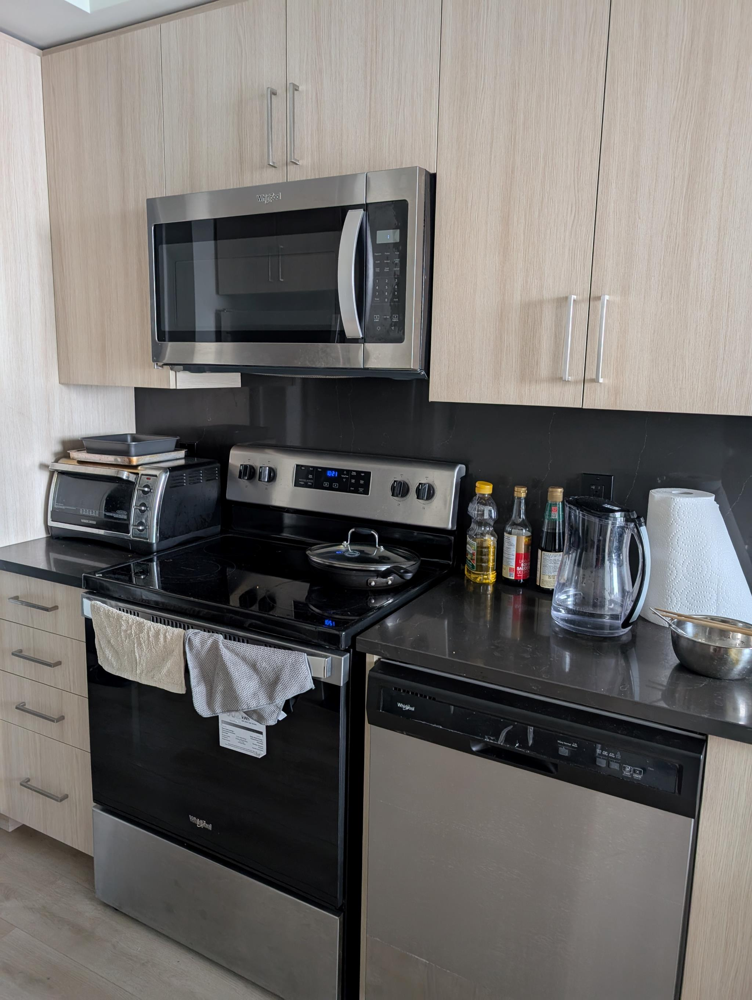

In [12]:
kitchen_portrait = Image.open("img/kitchen_portrait.jpg")
kitchen_portrait

## Grab video frames

In [13]:
zipnerf_video = get_zipnerf()
zipnerf_livingroom_time = [4, 10]
zipnerf_kitchen_time = [10, 12]

Video already available locally at img/zipnerf.mp4.


In [14]:
sample_frames = extract_frames(zipnerf_video, zipnerf_kitchen_time[0], 0.1, 3)
shortvid_frames = extract_frames(zipnerf_video, zipnerf_kitchen_time[0] - 1, 0.05, 60)

Frame rate: 60.0 FPS
Total frames: 1920
Frame rate: 60.0 FPS
Total frames: 1920


# Try generating a hierarchical scene graph

In [15]:
with open("graph_distance/hierarchical_sg/prompt.txt", "r") as f:
    prompt = f.read()

In [16]:
kitchen_portrait_graph = sgg.generate_scene_graph(kitchen_portrait, prompt)
kitchen_portrait_graph

{'id': 1,
 'name': 'kitchen',
 'bbox': [0, 0, 999, 999],
 'attributes': [],
 'predicate': 'root',
 'children': [{'id': 2,
   'name': 'cabinets',
   'bbox': [0, 0, 386, 999],
   'attributes': ['light wood'],
   'predicate': 'in',
   'children': [{'id': 3,
     'name': 'microwave',
     'bbox': [150, 186, 343, 576],
     'attributes': ['stainless steel'],
     'predicate': 'on',
     'children': []}]},
  {'id': 4,
   'name': 'countertop',
   'bbox': [386, 0, 702, 999],
   'attributes': ['dark grey'],
   'predicate': 'in',
   'children': [{'id': 5,
     'name': 'toaster oven',
     'bbox': [445, 65, 540, 280],
     'attributes': ['black'],
     'predicate': 'on',
     'children': []},
    {'id': 6,
     'name': 'cooktop',
     'bbox': [445, 280, 574, 628],
     'attributes': ['stainless steel'],
     'predicate': 'on',
     'children': [{'id': 7,
       'name': 'pan',
       'bbox': [518, 361, 580, 527],
       'attributes': ['black'],
       'predicate': 'on',
       'children': []}]},
 

In [17]:
simple_print(kitchen_portrait_graph)

kitchen (1) root: []
	cabinets (2) in: ['light wood']
		microwave (3) on: ['stainless steel']
	countertop (4) in: ['dark grey']
		toaster oven (5) on: ['black']
		cooktop (6) on: ['stainless steel']
			pan (7) on: ['black']
		bottles (8) on: []
		pitcher (9) on: ['clear']
		paper towels (10) on: ['white']
		bowl (11) on: ['metal']
	oven (12) on: ['stainless steel', 'black']
	dishwasher (13) on: ['stainless steel']


In [18]:
objects, relationships = parse_tree(kitchen_portrait_graph)

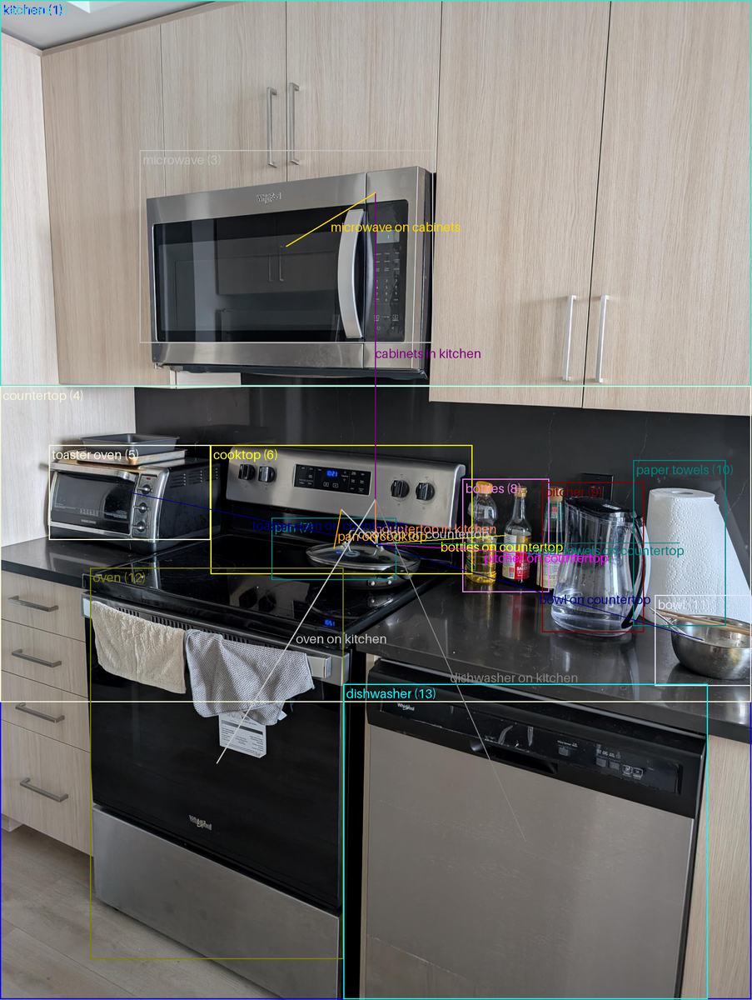

In [19]:
draw = Drawer(kitchen_portrait)

draw.add_objects(objects)
draw.add_relationships(relationships)

draw.draw()
draw.show()

In [20]:
# sample_graphs = []
# for frame in sample_frames:
#     sample_graph = sgg.generate_scene_graph(frame, prompt)
#     sample_graphs.append(sample_graph)
#     simple_print(sample_graph)

# Tree Edit Distance

In [22]:
from graph_distance.hierarchical_sg.tree_edit_distance import tree_edit_distance
from graph_distance.hierarchical_sg.sumoted import sumoted_distance

In [23]:
# load example graphs from json

test_names = [
    "base",
    "bbox_bad",
    "bbox_good",
    "id",
    "move_node",
    "move_subtree",
    "name",
]

modified_tests = [x for x in test_names if x != "base"]

test_graphs = {}
for name in test_names:
    with open(f"graph_distance/hierarchical_sg/tests/{name}.json", "r") as f:
        test_graphs[name] = json.load(f)

In [24]:
print(tree_edit_distance(test_graphs["base"], test_graphs["name"]))
print(tree_edit_distance(test_graphs["base"], test_graphs["bbox_bad"]))

1.0
1.0


In [25]:
sumoted_distance(test_graphs["base"], test_graphs["move_subtree"], normalized=False)

np.int64(6)

In [26]:
# try all combinations and report the measures
# we want to try base and every other graph, and across both metrics

metrics = {
    "TED (↓)": tree_edit_distance,
    "SumoTED (↓)": lambda a,b: sumoted_distance(a, b, normalized=False),
    "SumoTED_norm (↑)": lambda a,b: sumoted_distance(a, b, normalized=True),
}

results = {}

for metric in metrics.keys():
    results[metric] = {}
    for other in modified_tests:
        results[metric][other] = {}
        results[metric][other] = metrics[metric](test_graphs["base"], test_graphs[other])


Error: Tree has multiple roots: [0 2]
Error: Tree has multiple roots: [0 2]


In [27]:
# print the results in a markdown table format

# header row is the other graph (being compared to base)
# header col is the metric

# header row
print("|  | " + " | ".join(modified_tests) + " |")
# separator row
print("|---|" + "|".join(["---" for _ in modified_tests]) + "|")
# data rows
for metric in metrics.keys():
    print(f"| {metric} | ", end="")
    for other in modified_tests:
        print(f"{results[metric][other]} | ", end="")
    print("")
# print the results in a markdown table format
print("\n\n\n")

|  | bbox_bad | bbox_good | id | move_node | move_subtree | name |
|---|---|---|---|---|---|---|
| TED (↓) | 1.0 | 1.0 | 1.0 | 2.0 | 4.0 | 1.0 | 
| SumoTED (↓) | 0 | 0 | None | 4 | 6 | 0 | 
| SumoTED_norm (↑) | 1.0 | 1.0 | None | 0.6666666666666667 | 0.5714285714285714 | 1.0 | 






|  | bbox_bad | bbox_good | id | move_node | move_subtree | name |
|---|---|---|---|---|---|---|
| TED (↓) | 1.0 | 1.0 | 1.0 | 2.0 | 4.0 | 1.0 | 
| SumoTED (↓) | 0 | 0 | None | 4 | 6 | 0 | 
| SumoTED_norm (↑) | 1.0 | 1.0 | None | 0.6666666666666667 | 0.5714285714285714 | 1.0 | 